In [1]:
import os
import numpy as np
from matplotlib import ticker, cm
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.path as mpath
from copy import copy
import seaborn as sn
#from scipy import ndimage
from scipy.interpolate import griddata, NearestNDInterpolator
from numpy import uint32, uint64, float64, float32, linspace, array, logspace, sin, cos, pi, arange
from arepy.read_write import binary_read as rsnap
from arepy.visualize import data_inspection as vis
from arepy.utility import snap_utility as snut
from scipy.optimize import curve_fit
from matplotlib import gridspec
from arepy.utility import cgs_constants as cgs
from scipy.spatial import Voronoi, Delaunay, ConvexHull, voronoi_plot_2d
from matplotlib import ticker
plt.style.use('classic')

In [4]:
### constants: 
kb = 1.38e-23
kb_cgs = 1.38e-16
mH = 1.67e-24
mu = 2.8
h = 6.626e-34
h_cgs = 6.62e-27
gamma = 5./3.
pc2cm = 3.086e18
msun2g = 2e33

arepoLength = 3.0856e20
arepoMass = 1.991e33
arepoVel = 1.0e5

def rotate(x,y,theta):
  xprime = x*cos(theta) - y*sin(theta)
  yprime = x*sin(theta) + y*cos(theta)
  return xprime, yprime

arepoTime = arepoLength/arepoVel
arepoDensity = arepoMass/arepoLength/arepoLength/arepoLength
arepoEnergy= arepoMass*arepoVel*arepoVel
arepoColumnDensity = arepoMass/arepoLength/arepoLength

In [3]:
print arepoDensity

6.77723246309e-29


Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_100
Particles [ 53662787         0 117899847         0         0         0]
Masses [0. 0. 0. 0. 0. 0.]
Gas particles 53662787
Tracer particles 117899847
Time =  [1.00048828]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53662787


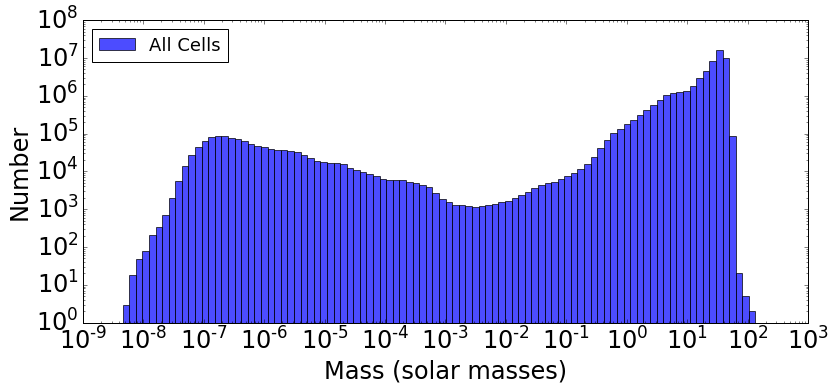

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_101
Particles [ 53654514         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53654514
Tracer particles 117899847
Time =  [1.00073236]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53654514


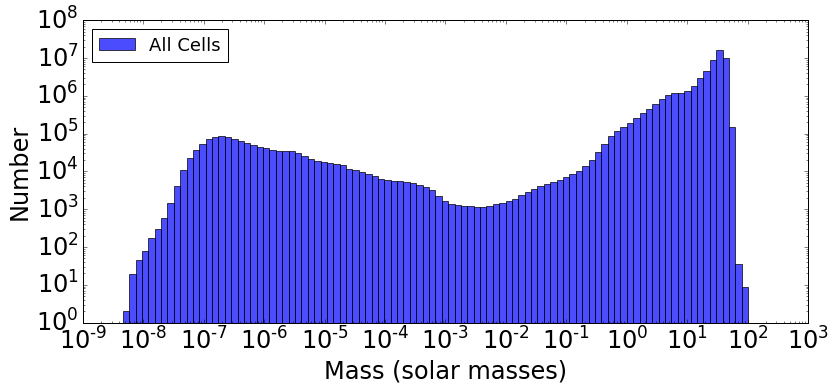

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_102
Particles [ 53652655         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53652655
Tracer particles 117899847
Time =  [1.00122052]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53652655


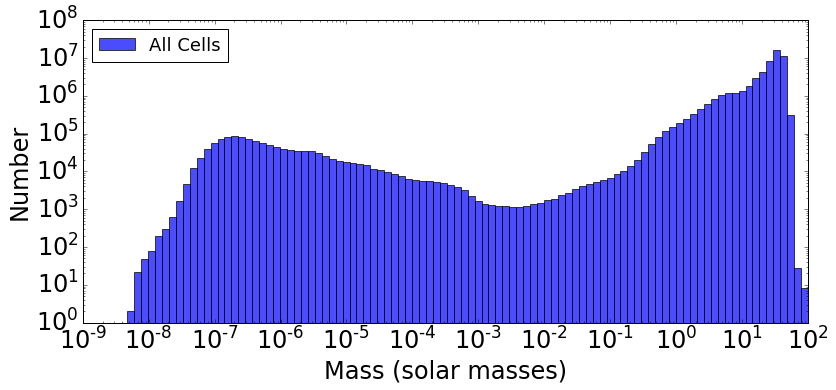

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_103
Particles [ 53652637         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53652637
Tracer particles 117899847
Time =  [1.00170869]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53652637


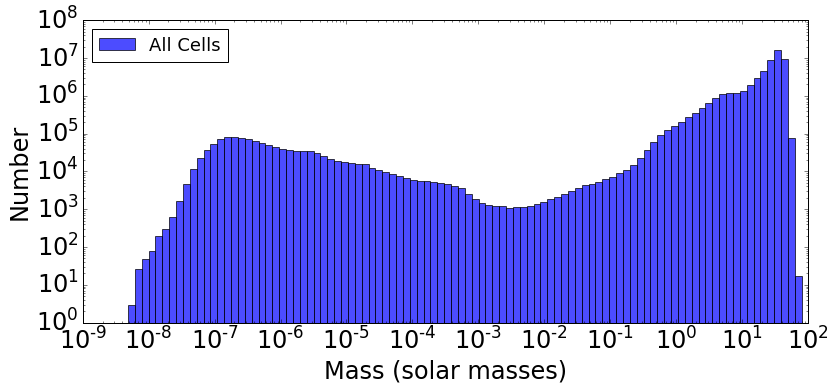

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_104
Particles [ 53652289         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53652289
Tracer particles 117899847
Time =  [1.00219685]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53652289


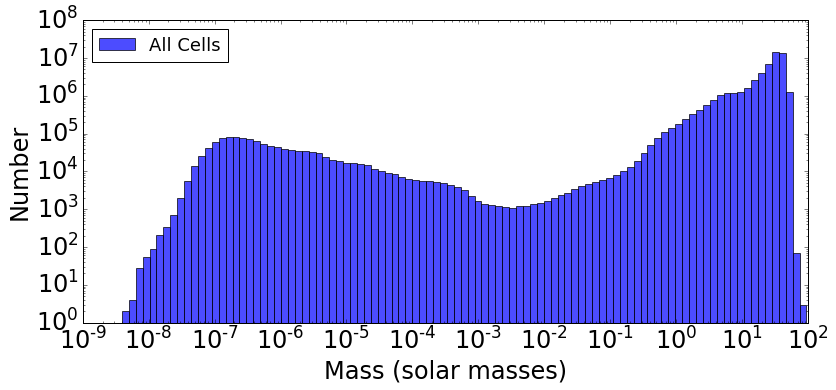

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_105
Particles [ 53651064         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53651064
Tracer particles 117899847
Time =  [1.00268501]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53651064


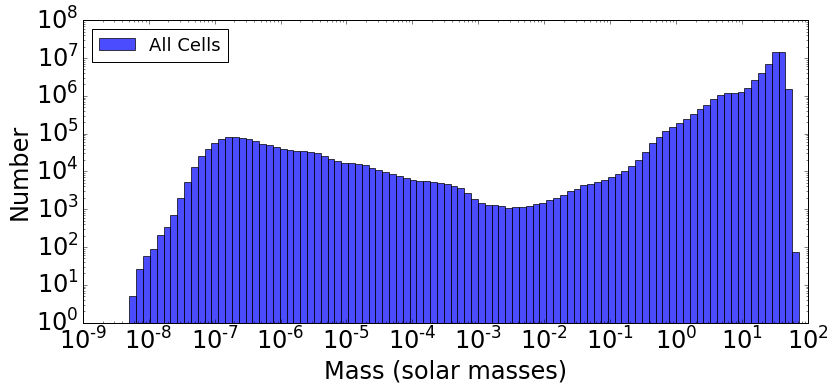

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_106
Particles [ 53649919         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53649919
Tracer particles 117899847
Time =  [1.00317317]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53649919


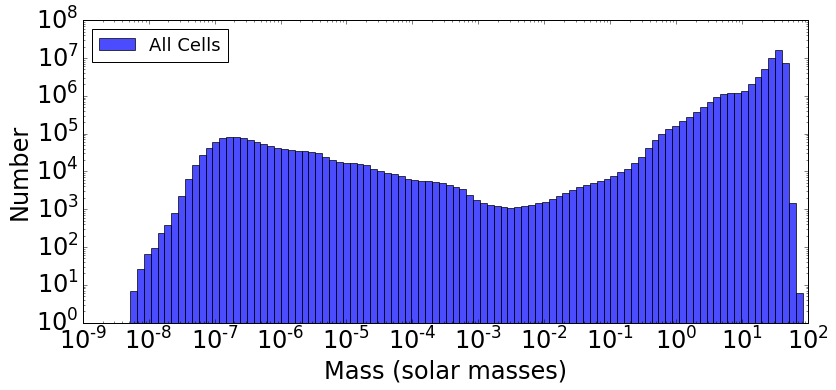

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_107
Particles [ 53649900         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53649900
Tracer particles 117899847
Time =  [1.00366133]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53649900


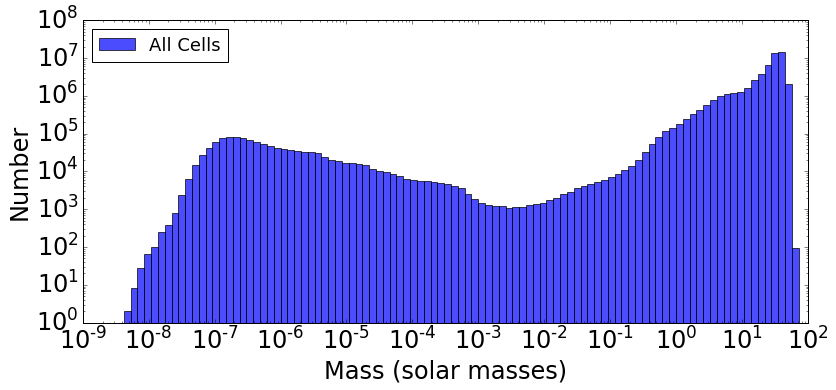

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_108
Particles [ 53649778         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53649778
Tracer particles 117899847
Time =  [1.0041495]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53649778


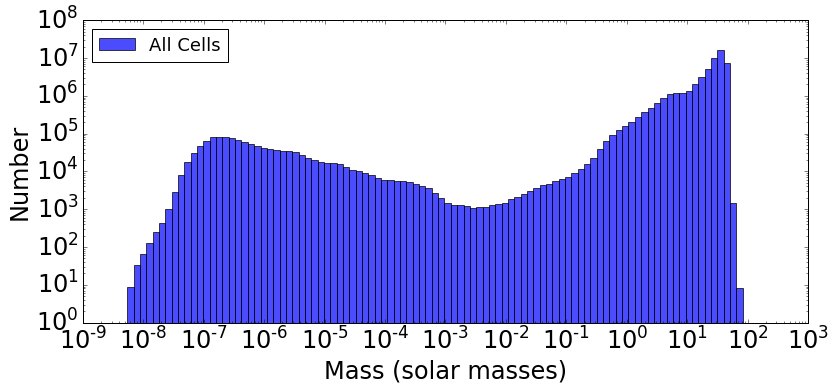

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_109
Particles [ 53650055         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53650055
Tracer particles 117899847
Time =  [1.00463766]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53650055


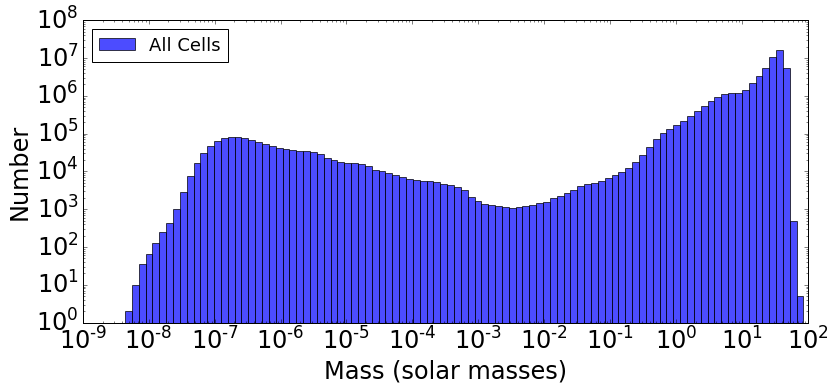

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_110
Particles [ 53649648         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53649648
Tracer particles 117899847
Time =  [1.00512582]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53649648


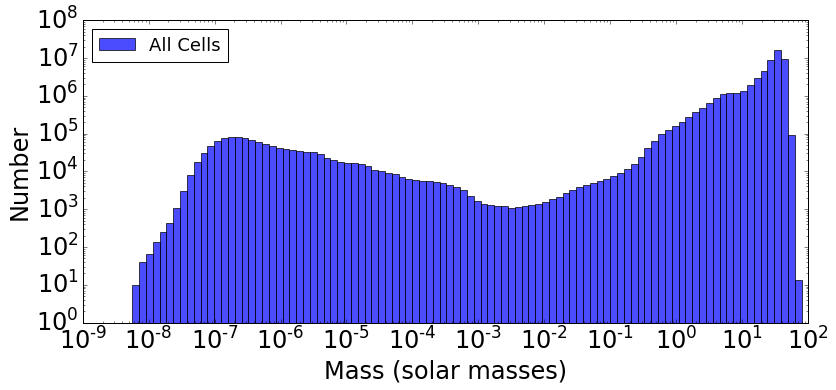

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_111
Particles [ 53650130         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53650130
Tracer particles 117899847
Time =  [1.00561398]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53650130


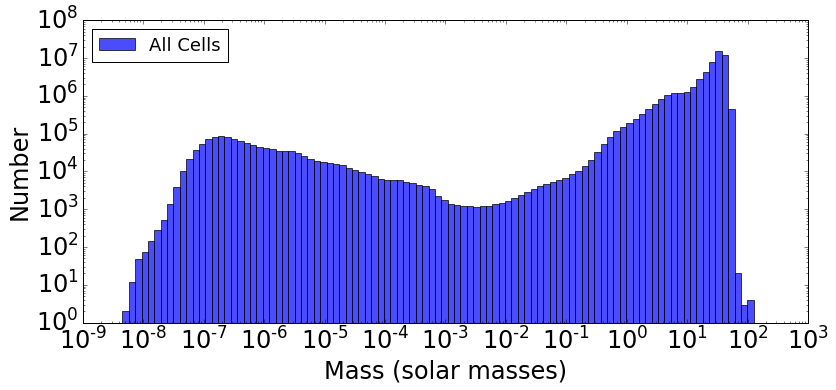

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_112
Particles [ 53650314         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53650314
Tracer particles 117899847
Time =  [1.00610214]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53650314


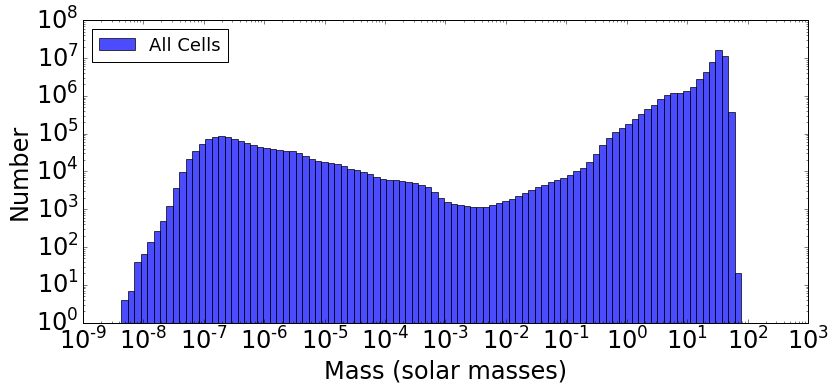

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_113
Particles [ 53650075         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53650075
Tracer particles 117899847
Time =  [1.00659031]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53650075


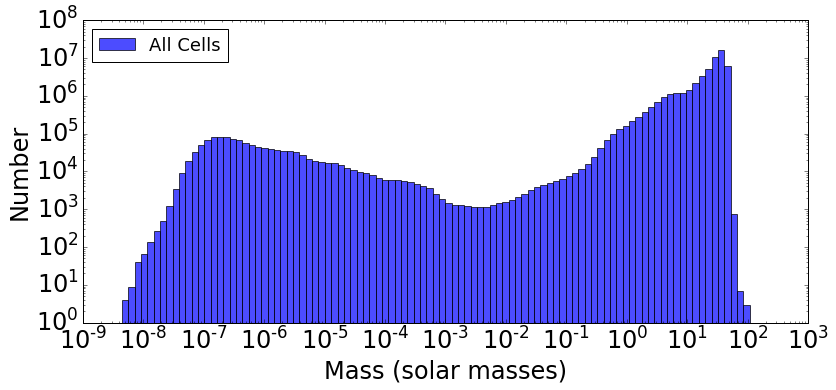

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_114
Particles [ 53650241         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53650241
Tracer particles 117899847
Time =  [1.00707847]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53650241


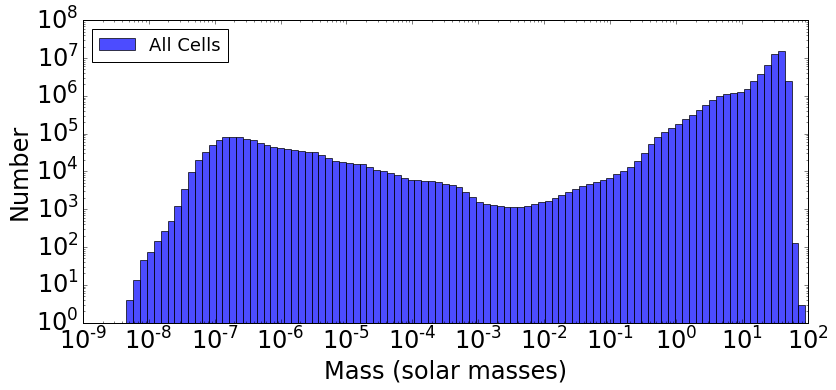

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_115
Particles [ 53650201         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53650201
Tracer particles 117899847
Time =  [1.00756663]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53650201


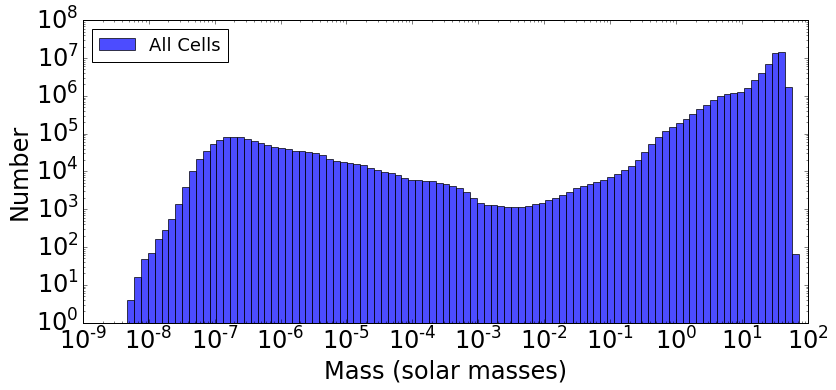

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_116
Particles [ 53649721         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53649721
Tracer particles 117899847
Time =  [1.00805479]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53649721


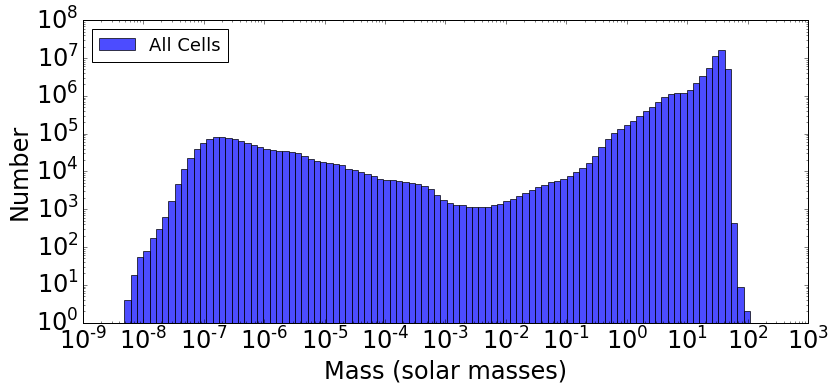

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_117
Particles [ 53650181         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53650181
Tracer particles 117899847
Time =  [1.00854295]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53650181


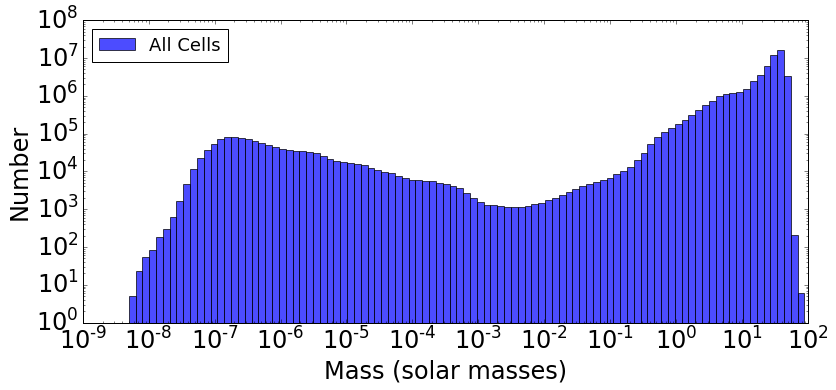

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_118
Particles [ 53650689         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53650689
Tracer particles 117899847
Time =  [1.00903112]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53650689


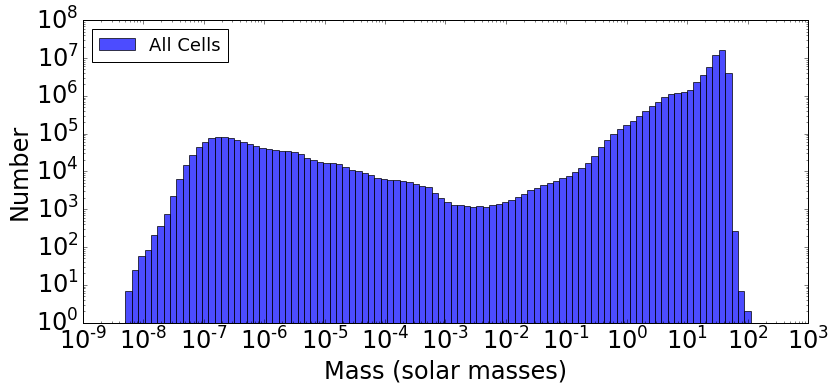

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_119
Particles [ 53650405         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53650405
Tracer particles 117899847
Time =  [1.00951928]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53650405


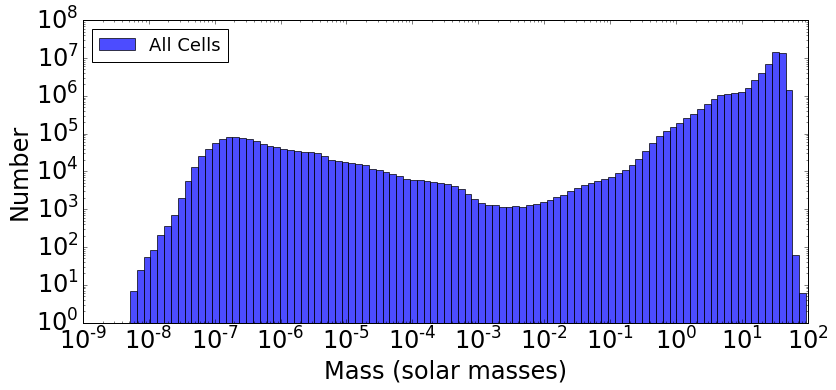

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_120
Particles [ 53648923         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53648923
Tracer particles 117899847
Time =  [1.01000524]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53648923


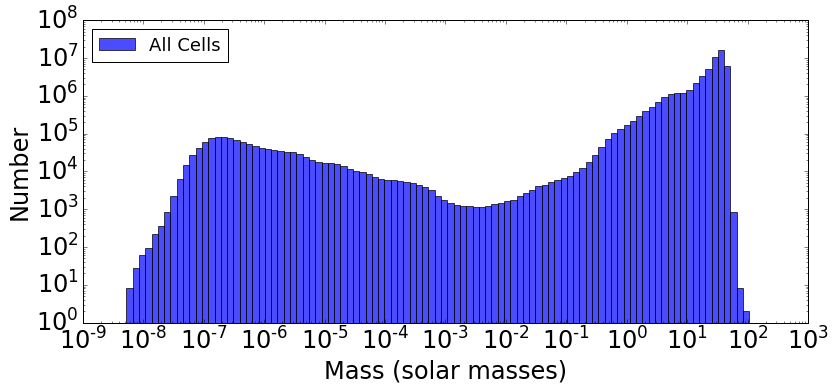

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_121
Particles [ 53649153         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53649153
Tracer particles 117899847
Time =  [1.01073417]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53649153


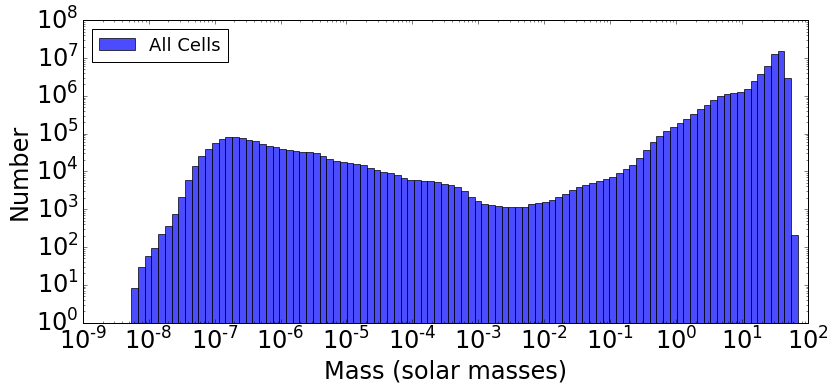

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_122
Particles [ 53649685         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53649685
Tracer particles 117899847
Time =  [1.01122013]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53649685


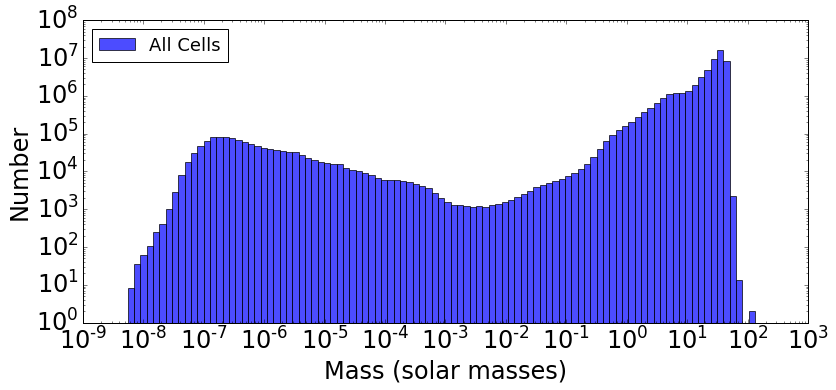

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_123
Particles [ 53650023         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53650023
Tracer particles 117899847
Time =  [1.01170609]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53650023


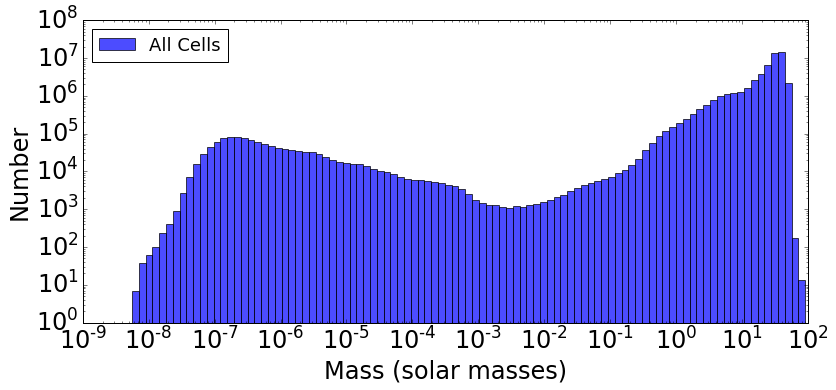

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_124
Particles [ 53650389         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53650389
Tracer particles 117899847
Time =  [1.01219204]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53650389


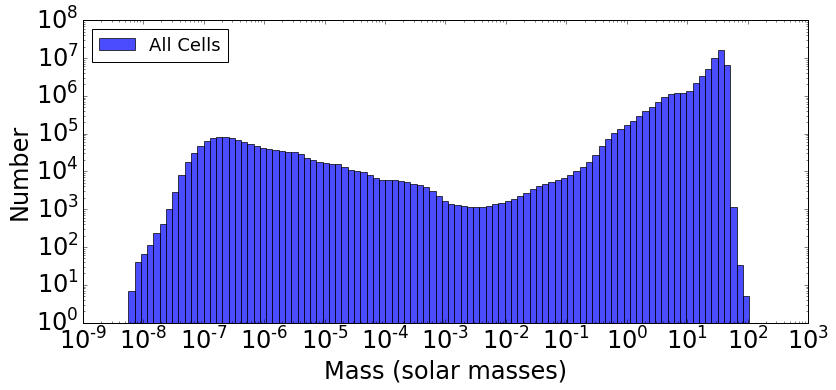

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_125
Particles [ 53651420         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53651420
Tracer particles 117899847
Time =  [1.012678]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53651420


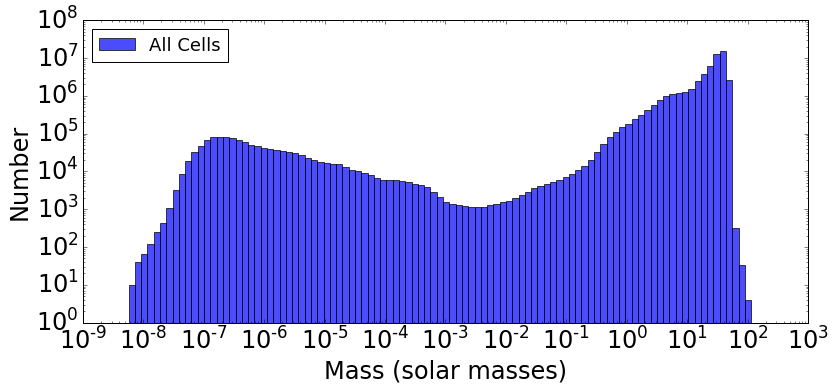

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_126
Particles [ 53652131         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53652131
Tracer particles 117899847
Time =  [1.01316396]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53652131


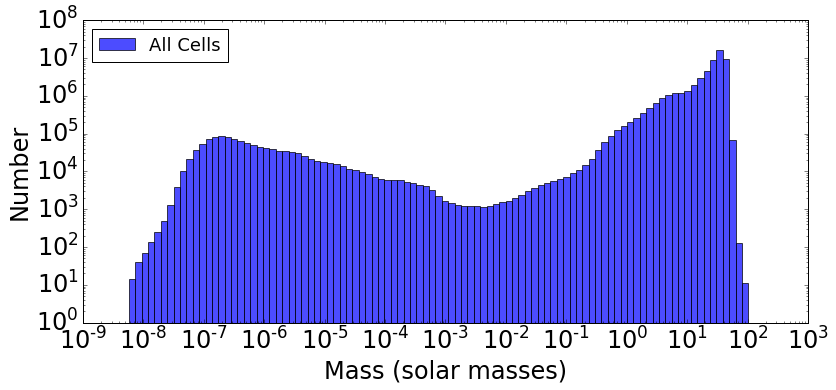

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_127
Particles [ 53653418         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53653418
Tracer particles 117899847
Time =  [1.01364992]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53653418


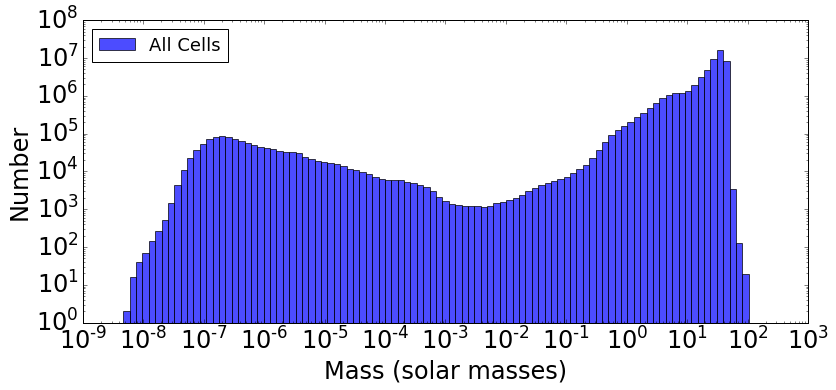

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_128
Particles [ 53655084         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53655084
Tracer particles 117899847
Time =  [1.01413587]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53655084


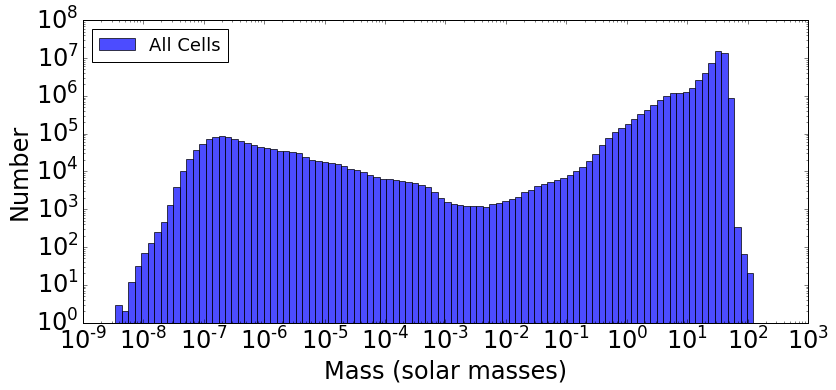

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_129
Particles [ 53655529         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53655529
Tracer particles 117899847
Time =  [1.01462183]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53655529


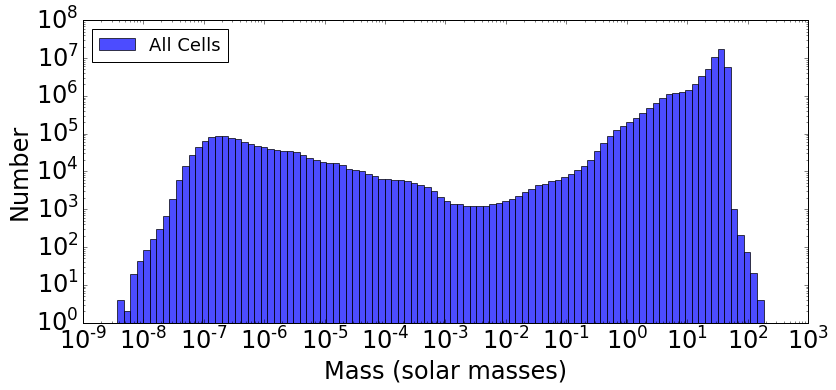

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_130
Particles [ 53656177         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53656177
Tracer particles 117899847
Time =  [1.01510779]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53656177


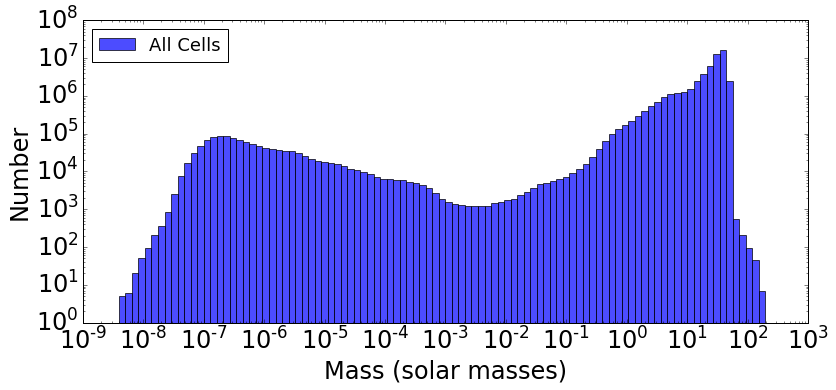

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_131
Particles [ 53657294         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53657294
Tracer particles 117899847
Time =  [1.01559374]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53657294


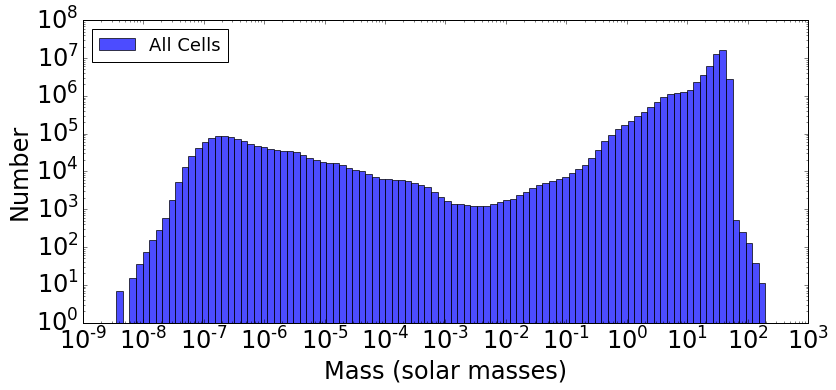

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_132
Particles [ 53658639         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53658639
Tracer particles 117899847
Time =  [1.0160797]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53658639


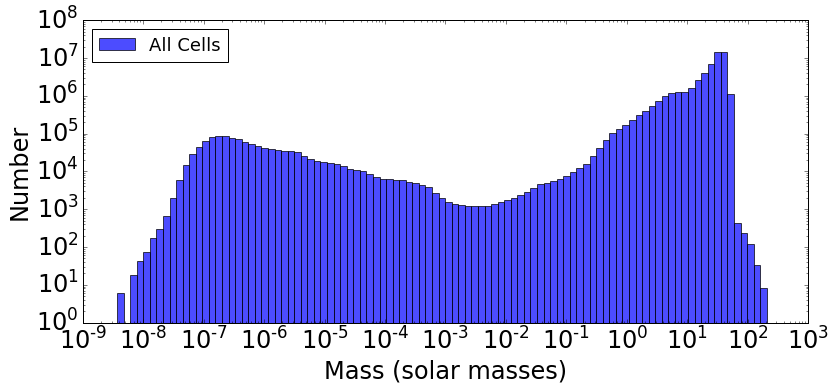

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_133
Particles [ 53659219         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53659219
Tracer particles 117899847
Time =  [1.01656566]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53659219


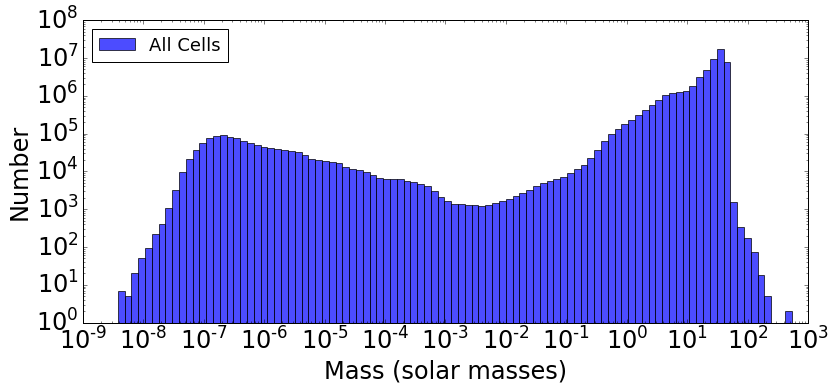

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_test/OUTPUT/whole_disk_134
Particles [ 53660039         0 117899847         0         0         0]
Masses [0.         0.         5.35741731 0.         0.         0.        ]
Gas particles 53660039
Tracer particles 117899847
Time =  [1.01705162]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
53660039


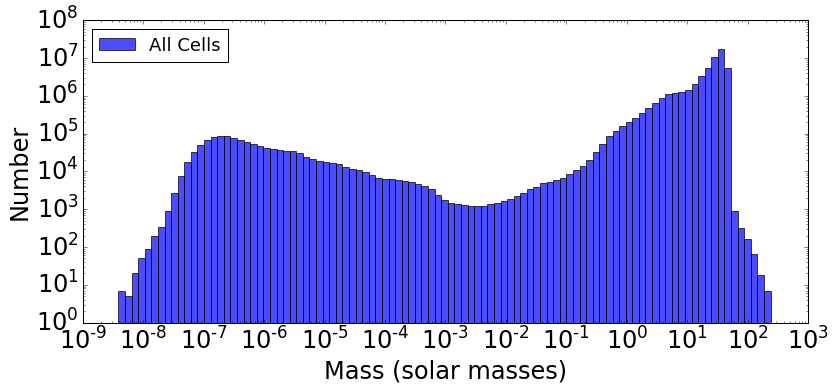

KeyboardInterrupt: 

In [4]:
### Plotting 1D histograms of cells properties
out_path = '/beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/'
save_path = '/beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/'
rsnap.io_flags['sgchem'] = True
rsnap.io_flags['mc_tracer']=True

for isnap in arange(100,139):
    file_suffix = '%03d'%isnap
    data_test, header_test = rsnap.read_snapshot(out_path+'whole_disk_'+file_suffix)

    maxvol = 1000.

    ### Arrays to build:
    n_particles = len(data_test['mass'])
    mass_test = data_test['mass']
    rho_test = data_test['rho']*arepoDensity
    print n_particles

    massbins = np.logspace(np.log10(min(mass_test)),np.log10(max(mass_test)),100)
    plt.rcParams.update({'font.size': 24}) #set fontsize
    histfig = plt.figure(3,figsize=(13,6))
    histfig.clf()
    ax = histfig.gca()
    plt.ylabel('Number')
    plt.xlabel('Mass (solar masses)')
    h1,l1,p1 = ax.hist(mass_test,
                       massbins, color='blue',alpha=0.7, log=True,
                       label='All Cells')
    ax.set_xscale("log")
    #ax.set_yscale('linear')
    plt.gcf().subplots_adjust(bottom=0.2) #make room for x-axis

    legend = plt.legend(loc='upper left', shadow=False, fontsize=18)#'x-large')

    # Save figure
    # Need to save it as a PDF, otherewise, lose transparency
    plt.savefig(save_path + 'mass_histogram_'+file_suffix+'.png', dpi=100, bbox_inches='tight')
    plt.show()
    plt.close()

    ### For rho 
    rhobins = np.logspace(np.log10(min(rho_test)),np.log10(max(rho_test)),100)
    plt.rcParams.update({'font.size': 24}) #set fontsize
    histfig = plt.figure(3,figsize=(13,6))
    histfig.clf()
    ax = histfig.gca()
    plt.ylabel('Number')
    plt.xlabel('Rho')
    h3,l3,p3 = ax.hist(rho_test,
                       rhobins, color='blue',alpha=0.7, log=True,
                       label='All Cells')
    ax.set_xscale("log")
    #ax.set_yscale('linear')
    plt.gcf().subplots_adjust(bottom=0.2) #make room for x-axis

    legend = plt.legend(loc='upper left', shadow=False, fontsize=18)#'x-large')

    # Save figure
    # Need to save it as a PDF, otherewise, lose transparency
    plt.savefig(save_path + 'rho_histogram_'+file_suffix+'.png', dpi=100, bbox_inches='tight')


Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_100
Particles [ 53662787         0 117899847         0         0         0]
Masses [0. 0. 0. 0. 0. 0.]
Gas particles 53662787
Tracer particles 117899847
Time =  [1.00048828]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
2.6300845e-38 7.61091e-18
(53662787, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/rho_2kpc_100.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_101
Particles [ 53649815         0 117899847         0         0         0]
Masses [0.         0.         5.35618115 0.         0.         0.        ]
Gas particles 53649815
Tracer particles 117899847
Time =  [1.00512582]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
2.4878406e-38 4.3372347e-18
(53649815, 3)
(601, 601

ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
7.211257e-38 3.4134703e-17
(53854281, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/rho_2kpc_114.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_115
Particles [ 53870722         0 117899847         0         0         0]
Masses [0.         0.         5.33957738 0.         0.         0.        ]
Gas particles 53870722
Tracer particles 117899847
Time =  [1.07505153]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
6.483348e-38 1.93911e-17
(53870722, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/rho_2kpc_115.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_116
Particles [ 53889561         0 117899847         0         0         0]
Masses [0.         

/home/hd/hd_hd/hd_rm238/lib/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_121
Particles [ 53983544         0 117899847         0         0         0]
Masses [0.         0.         5.33957738 0.         0.         0.        ]
Gas particles 53983544
Tracer particles 117899847
Time =  [1.10504766]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
3.2091758e-38 4.4439944e-17
(53983544, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/rho_2kpc_121.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_122
Particles [ 54003550         0 117899847         0         0         0]
Masses [0.         0.         5.33957738 0.         0.         0.        ]
Gas particles 54003550
Tracer particles 117899847
Time =  [1.11000765]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
2

ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
1.2878105e-38 4.3279354e-17
(54065190, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/rho_2kpc_135.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_136
Particles [ 54051492         0 117899847         0         0         0]
Masses [0.         0.         5.32196564 0.         0.         0.        ]
Gas particles 54051492
Tracer particles 117899847
Time =  [1.18005606]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
1.1922711e-38 7.587439e-17
(54051492, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/rho_2kpc_136.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_137
Particles [ 54035395         0 117899847         0         0         0]
Masses [0.      

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_150
Particles [ 53909161         0 117899847         0         0         0]
Masses [0.         0.         5.31761548 0.         0.         0.        ]
Gas particles 53909161
Tracer particles 117899847
Time =  [1.25002449]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
2.633038e-39 7.531764e-17
(53909161, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/rho_2kpc_150.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_151
Particles [ 53872681         0 117899847         0         0         0]
Masses [0.         0.         5.31761548 0.         0.         0.        ]
Gas particles 53872681
Tracer particles 117899847
Time =  [1.25510585]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
2.3

ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
4.8695884e-38 2.424576e-16
(53811103, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/rho_2kpc_164.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_165
Particles [ 53792672         0 117899847         0         0         0]
Masses [0.         0.         5.34576263 0.         0.         0.        ]
Gas particles 53792672
Tracer particles 117899847
Time =  [1.32517585]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
4.6873179e-38 2.436991e-16
(53792672, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/rho_2kpc_165.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_166
Particles [ 53746558         0 117899847         0         0         0]
Masses [0.       

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_179
Particles [ 53853816         0 117899847         0         0         0]
Masses [0.         0.         5.33459704 0.         0.         0.        ]
Gas particles 53853816
Tracer particles 117899847
Time =  [1.39501548]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
2.3086681e-38 5.020534e-16
(53853816, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/rho_2kpc_179.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_180
Particles [ 53806847         0 117899847         0         0         0]
Masses [0.         0.         5.33459704 0.         0.         0.        ]
Gas particles 53806847
Tracer particles 117899847
Time =  [1.40018835]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
2.

ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
1.9174589e-38 7.2849736e-16
(53675834, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/rho_2kpc_193.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_194
Particles [ 53669975         0 117899847         0         0         0]
Masses [0.         0.         5.33459704 0.         0.         0.        ]
Gas particles 53669975
Tracer particles 117899847
Time =  [1.47002219]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
2.025247e-38 5.5734636e-16
(53669975, 3)
(601, 601, 11)
Writing /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/rho_2kpc_194.png...
Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_195
Particles [ 53657109         0 117899847         0         0         0]
Masses [0.      

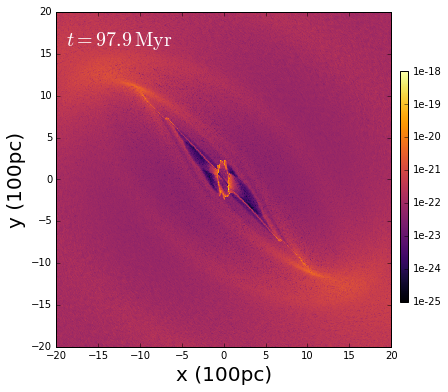

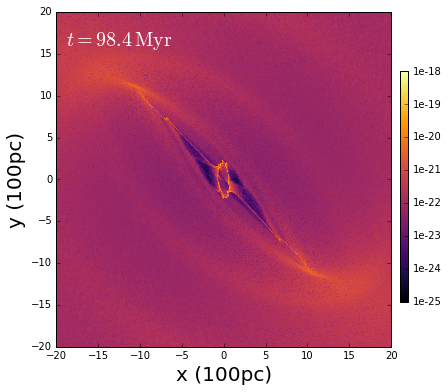

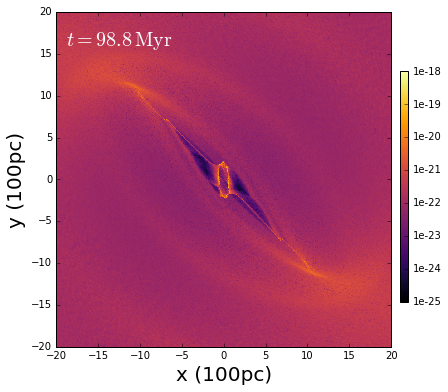

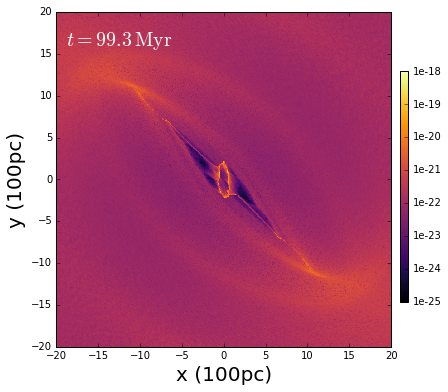

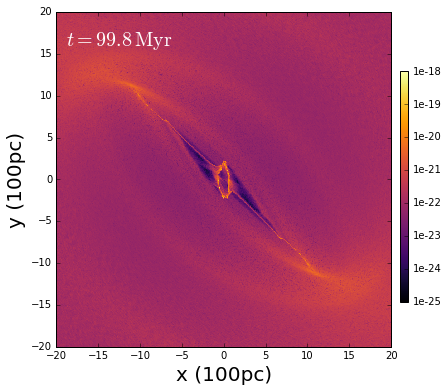

...

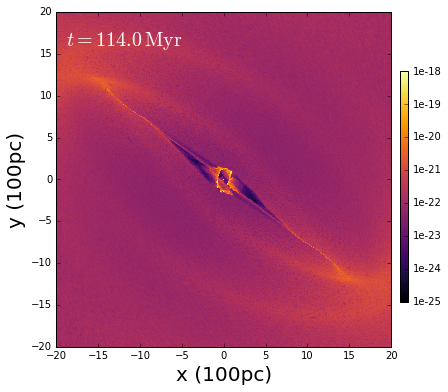

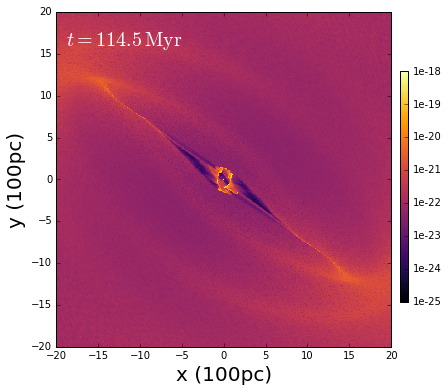

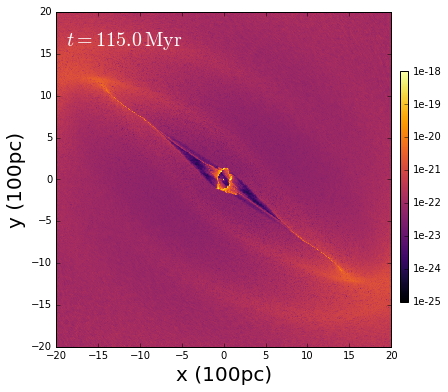

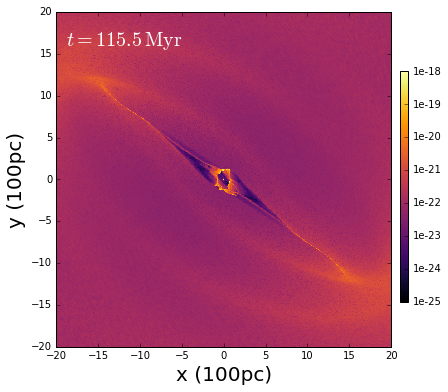

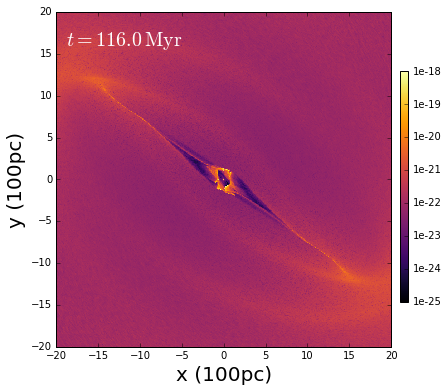

In [ ]:
### Plot rho slices
plt.close()
out_path = '/beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/'
save_path = '/beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/'
rsnap.io_flags['sgchem'] = True
rsnap.io_flags['mc_tracer']=True

for isnap in arange(100,203):
  # read the data
    rsnap.io_flags['sgchem'] = True
    rsnap.io_flags['mc_tracer']=True
    data, header = rsnap.read_snapshot(out_path+'whole_disk_%03d'%isnap)
    t = header['time']
    x,y,z=data['pos'].T
    x,y,z = x-120.0, y-120.0, z-120.0
    phi = np.radians(20)
    omega=4.0
    x,y = rotate(x,y,omega*t - phi)
    rho = data['rho']*arepoDensity
    print min(rho), max(rho)
    masses = data['mass']
    vx,vy,vz = data['vel'].T
    energy_per_unit_mass = data['u_therm']
      
    points = np.vstack((x,y,z)).T
    print points.shape
    rhof = NearestNDInterpolator(points,rho)

    Nx, Ny, Nz = 601, 601, 11
    plotrange=20
    xboost = 0
    yboost = 0
    zslice=5
    xgrid, ygrid, zgrid = linspace(-plotrange,plotrange,Nx), linspace(-plotrange,plotrange,Ny), linspace(-10,10,Nz)
    #xgrid, ygrid, zgrid = linspace(-plotrange + xboost,plotrange + xboost,Nx), linspace(-plotrange + yboost,plotrange + yboost,Ny), linspace(-plotrange,plotrange,Nz)
    XGRID,YGRID,ZGRID = np.meshgrid(xgrid,ygrid,zgrid)
    RHO = rhof(XGRID,YGRID,ZGRID)
    print RHO.shape
  
    # plot
    fig, ax = plt.subplots(1,1,figsize=(6,8))
    u = 1.0
    extent = (xgrid.min()/u,xgrid.max()/u,ygrid.min()/u,ygrid.max()/u)
    levels = logspace(2,6,256)
    #norm = colors.BoundaryNorm(levels, 256)
    #dynamical_range = 8
    #levels = np.logspace(1e-34,1e-18,21)
    #norm = colors.BoundaryNorm(levels,256)
    #norm = colors.LogNorm(vmin=np.min(RHO[:,:,5]),vmax=np.max(RHO[:,:,5]))
    norm = colors.LogNorm(vmin=np.min(1e-25),vmax=np.max(1e-18))
    im = ax.imshow(RHO[:,:,zslice],origin='l',norm=norm,extent=extent,cmap='inferno',interpolation='nearest')
    #im = ax.imshow(RHO[:,:,zslice],origin='l',extent=extent,cmap='inferno',interpolation='nearest')

    ax.set_xlabel(r'x (100pc)',fontsize=20)
    ax.set_ylabel(r'y (100pc)',fontsize=20)
    ax.annotate(r'$t=%.1f\,\rm Myr$'%(t*97.856),xy=(0.03,0.9),xycoords='axes fraction',fontsize=20,color='w')
    fig.subplots_adjust(right=0.9)
    fig.subplots_adjust(wspace=0.0,hspace=0.0)
    cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
    #cbar = fig.colorbar(im,cax=cbar_ax,ticks=np.logspace(1e-25,1e-18,21),format='%.0e')
    #plt.colorbar(im,cax=cbar_ax,ticks=logspace(-10,10,21),format='%.0e')
    cbar = plt.colorbar(im,cax=cbar_ax,ticks = [1e-25,1e-24,1e-23,1e-22,1e-21,1e-20,1e-19,1e-18],format='%.0e')
    writename = save_path+'rho_2kpc_%03d.png'%isnap
    
    print 'Writing '+writename+'...'
    fig.savefig(writename,bbox_inches='tight')
    #plt.close()

Loading file /beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/whole_disk_124
Particles [ 54007791         0 117899847         0         0         0]
Masses [0.         0.         5.33957738 0.         0.         0.        ]
Gas particles 54007791
Tracer particles 117899847
Time =  [1.12016382]
Precision: Float
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>
ID type:  <type 'numpy.uint64'>


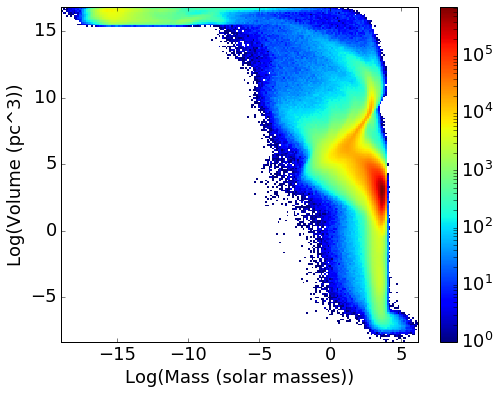

In [5]:
### Making a mass vs volume histogram
plt.close()
out_path = '/beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/OUTPUT/'
save_path = '/beegfs/work/workspace/ws/hd_rm238-m_production-0/sim_fast/anal/'
rsnap.io_flags['sgchem'] = True
rsnap.io_flags['mc_tracer']=True
file_suffix = '124'
data_test, header_test = rsnap.read_snapshot(out_path+'whole_disk_'+file_suffix)

### Arrays to build:
n_particles = len(data_test['mass'])
masses = data_test['mass']
rhos = data_test['rho']*arepoDensity
volumes = (masses/data_test['rho'])
### correct for code units for volume
volumes = volumes*(100**3) ### now in pc^3

#massbins = np.linspace(np.log(min(masses)),np.log(max(masses)),100)
#volbins = np.linspace(np.log(min(volumes)),np.log(max(volumes)),100)
#rhobins = np.linspace(np.log(min(volumes)),np.log(max(volumes)),100)

plt.rcParams.update({'font.size': 18}) #set fontsize
histfig,ax = plt.subplots(1,1,figsize=(8,6))
h = ax.hist2d(x=np.log(masses), y=np.log(volumes), bins=200, norm=colors.LogNorm())

plt.ylabel('Log(Volume (pc^3))')
plt.xlabel('Log(Mass (solar masses))')
#ax.set_xscale('log')
#ax.set_yscale('log')

plt.colorbar(h[3], ax=ax)

plt.show()

Loading file /beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_refinement_2-9-19/OUTPUT/whole_disk_105
Particles [12502760        0        0        0        0        0]
Masses [0. 0. 0. 0. 0. 0.]
Gas particles 12502760
Time =  [1.01024008]
Precision: Float
ID type:  <type 'numpy.uint32'>
(100,)
(100,)
(99, 99)


/home/hd/hd_hd/hd_rm238/lib/anaconda2/lib/python2.7/site-packages/matplotlib/contour.py:1544: UserWarning: Log scale: values of z <= 0 have been masked
  warnings.warn('Log scale: values of z <= 0 have been masked')


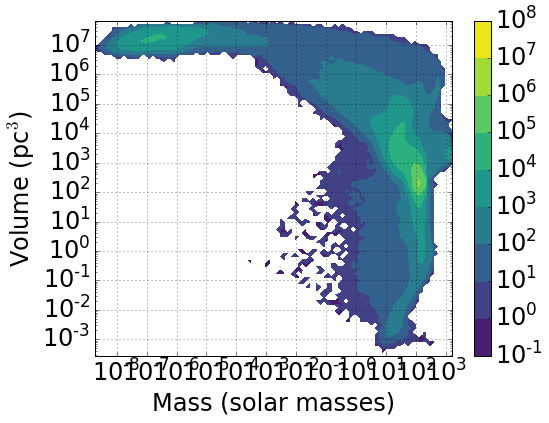

In [6]:
plt.close()
out_path = '/beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_refinement_2-9-19/OUTPUT/'
save_path = '/beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_refinement_2-9-19/anal/'
rsnap.io_flags['sgchem'] = True
rsnap.io_flags['mc_tracer']=False
file_suffix = '105'
data_test, header_test = rsnap.read_snapshot(out_path+'whole_disk_'+file_suffix)
fig, ax = plt.subplots(1,1,figsize=(8,6),facecolor='white')

mi, ma = -8.,-1.
levels = np.logspace(mi,ma,256)
norm = colors.BoundaryNorm(levels,256)

masses = data_test['mass']
volumes = (masses/data_test['rho'])
### correct for code units for volume
volumes = volumes*(100**3) ### now in pc^3

x, y = masses, volumes
bins = 100
xmi, xma = min(x), max(x)
ymi, yma = min(y), max(y)
xbins = np.logspace(np.log10(xmi),np.log10(xma),bins)
ybins = np.logspace(np.log10(ymi),np.log10(yma),bins)

h1, h2, h3 = np.histogram2d(x, y, bins=(xbins, ybins))

#h1[(h1 < 0.0001)] = np.nan
cmap = plt.cm.get_cmap("viridis")
cmap.set_bad("white", alpha=0.)
#ax.contourf(xbins[0:-1], ybins[0:-1], h1.T, cmap=cmap)
print xbins.shape
print ybins.shape
print h1.T.shape
cs = ax.contourf(xbins[0:-1], ybins[0:-1], h1.T, cmap=cmap, locator=ticker.LogLocator())

#ax.set_xlabel(r'$\rho \, [\rm{g/cm^3}]$',fontsize=22)
#ax.set_ylabel(r'$r_{\rm cell} \, [\rm{pc}]$',fontsize=22)
ax.set_xscale('log')
ax.set_yscale('log')
#ax.set_xlim([0.,3000.])
#ax.set_ylim([0.,0.00002])
plt.ylabel('Volume (pc$^3$)')
plt.xlabel('Mass (solar masses)')

fig.colorbar(cs)

ax.grid()
plt.show()


Loading file /beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_refinement_fidelity/OUTPUT/whole_disk_300
Particles [10858781        0        0        0        0        0]
Masses [0. 0. 0. 0. 0. 0.]
Gas particles 10858781
Time =  [1.40078115]
Precision: Float
ID type:  <type 'numpy.uint32'>


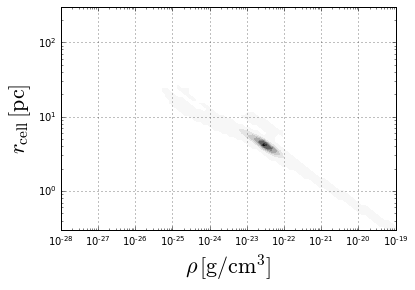

In [4]:
plt.close()
out_path = '/beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_refinement_fidelity/OUTPUT/'
save_path = '/beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_refinement_fidelity/anal/'
file_suffix = '300'
data_test, header_test = rsnap.read_snapshot(out_path+'whole_disk_'+file_suffix)
#gas = snut.return_type(data, header, 0)

fig, ax = plt.subplots()
mi, ma = -8.,-1.
levels = np.logspace(mi,ma,256)
norm = colors.BoundaryNorm(levels,256)

bins = 100
xmi, xma = -28, -18
ymi, yma = -1, 3
xbins = np.logspace(xmi,xma,bins)
ybins = np.logspace(ymi,yma,bins)


rho = data_test['rho']
mass = data_test['mass']
weightm = mass/mass.sum()

rcell = (3./4. / np.pi * mass / rho)**(1./3.) * rsnap.arepoLength / cgs.pc

x, y = rho*rsnap.arepoDensity, rcell
h1, h2, h3 = np.histogram2d(x, y, bins=(xbins, ybins), weights=weightm)

h2 = h2[0:-1] + 0.5*(h2[1:] - h2[0:-1])
h3 = h3[0:-1] + 0.5*(h3[1:] - h3[0:-1])

h1[(h1 < 0.0001)] = np.nan
cmap = plt.cm.get_cmap("Greys")
cmap.set_bad("white", alpha=0.)
cs = ax.contourf(xbins[0:-1], ybins[0:-1], h1.T, cmap=cmap)

ax.set_xlabel(r'$\rho \, [\rm{g/cm^3}]$',fontsize=22)
ax.set_ylabel(r'$r_{\rm cell} \, [\rm{pc}]$',fontsize=22)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim([1e-28,1e-19])
ax.set_ylim([0.3,300])

#fig.colorbar(cs)

ax.grid()
plt.show()

fig.savefig(save_path+'resolution_' + file_suffix + '.pdf',bbox_inches='tight', dpi=300)


In [ ]:
plt.close()
out_path = '/beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_nosinks_test_dec18/OUTPUT/'
save_path = '/beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_nosinks_test_dec18/anal/'
rsnap.io_flags['sgchem'] = True
rsnap.io_flags['mc_tracer']=False


# read the data
rsnap.io_flags['sgchem'] = True
rsnap.io_flags['mc_tracer']=False
data, header = rsnap.read_snapshot(out_path+'whole_disk_100')
t = header['time']
x,y,z=data['pos'].T
x,y,z = x-120.0, y-120.0, z-120.0
rho = data['rho']
masses = data['mass']
vx,vy,vz = data['vel'].T
energy_per_unit_mass = data['u_therm']
    
points = np.vstack((x,y,z)).T
rhof = NearestNDInterpolator(points,rho)

Nx, Ny, Nz = 601, 601, 11
plotrange=30
zslice=5
xgrid, ygrid, zgrid = linspace(-plotrange,plotrange,Nx), linspace(-plotrange,plotrange,Ny), linspace(-10,10,Nz)
XGRID,YGRID,ZGRID = np.meshgrid(xgrid,ygrid,zgrid)
RHO = rhof(XGRID,YGRID,ZGRID)
  
  # plot
fig, ax = plt.subplots(1,1,figsize=(6,8))
u = 1.0
extent = (xgrid.min()/u,xgrid.max()/u,ygrid.min()/u,ygrid.max()/u)
#levels = logspace(2,6,256)
#norm = colors.BoundaryNorm(levels, 256)
dynamical_range = 8
#levels = np.logspace(np.log10(rho.max())-dynamical_range, np.log10(rho.max()), 256)
#norm = colors.BoundaryNorm(levels,256)
im = ax.imshow(RHO[:,:,zslice],origin='l',norm=norm,extent=extent,cmap='inferno',interpolation='nearest')

ax.set_xlabel(r'$x$ (100pc)',fontsize=25)
ax.set_ylabel(r'$y$ (100pc)',fontsize=25)
ax.annotate(r'$t=%.1f\,\rm Myr$'%(t*97.856),xy=(0.03,0.9),xycoords='axes fraction',fontsize=20,color='w')
fig.subplots_adjust(right=0.9)
fig.subplots_adjust(wspace=0.0,hspace=0.0)
cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
plt.colorbar(im,cax=cbar_ax,ticks=logspace(-10,10,21),format='%.0e')

plt.show()


Loading file /beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_refinement_test/OUTPUT/whole_disk_150
Particles [3023361       0       0       0       0       0]
Masses [0. 0. 0. 0. 0. 0.]
Gas particles 3023361
Time =  [1.50146484]
Precision: Float
ID type:  <type 'numpy.uint32'>
200.0


/home/hd/hd_hd/hd_rm238/lib/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: object of type <type 'float'> cannot be safely interpreted as an integer.


[0.         0.02512563 0.05025126 0.07537688 0.10050251 0.12562814
 0.15075377 0.1758794  0.20100503 0.22613065 0.25125628 0.27638191
 0.30150754 0.32663317 0.35175879 0.37688442 0.40201005 0.42713568
 0.45226131 0.47738693 0.50251256 0.52763819 0.55276382 0.57788945
 0.60301508 0.6281407  0.65326633 0.67839196 0.70351759 0.72864322
 0.75376884 0.77889447 0.8040201  0.82914573 0.85427136 0.87939698
 0.90452261 0.92964824 0.95477387 0.9798995  1.00502513 1.03015075
 1.05527638 1.08040201 1.10552764 1.13065327 1.15577889 1.18090452
 1.20603015 1.23115578 1.25628141 1.28140704 1.30653266 1.33165829
 1.35678392 1.38190955 1.40703518 1.4321608  1.45728643 1.48241206
 1.50753769 1.53266332 1.55778894 1.58291457 1.6080402  1.63316583
 1.65829146 1.68341709 1.70854271 1.73366834 1.75879397 1.7839196
 1.80904523 1.83417085 1.85929648 1.88442211 1.90954774 1.93467337
 1.95979899 1.98492462 2.01005025 2.03517588 2.06030151 2.08542714
 2.11055276 2.13567839 2.16080402 2.18592965 2.21105528 2.23618

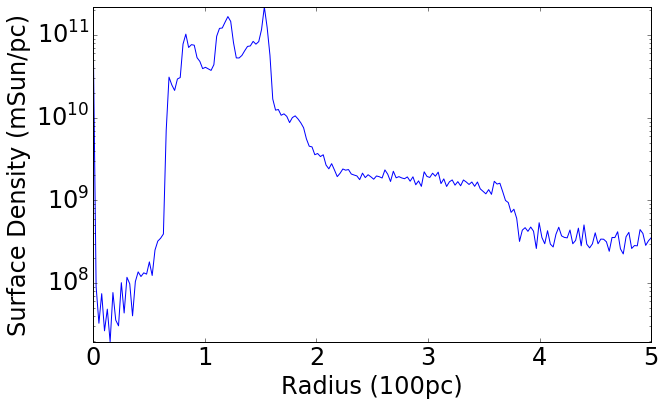

In [6]:
### The radial binned surface density plot
plt.close()
out_path = '/beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_refinement_test/OUTPUT/'
save_path = '/beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_refinement_test/anal/'
rsnap.io_flags['sgchem'] = True
rsnap.io_flags['mc_tracer']=False
data, header = rsnap.read_snapshot(out_path+'whole_disk_150')
t = header['time']
x,y,z=data['pos'].T
x,y,z = x-120.0, y-120.0, z-120.0
rho = data['rho']
mass = data['mass']

rmin = 0.
rmax = 5.
rstep = 0.025 # must be a factor of rmax-rmin
nstep = (rmax-rmin)/rstep
rbins = np.linspace(rmin,rmax,nstep)
rsigma = np.zeros(len(rbins))
print nstep

for nbin in range(len(rbins)):
    mass_enc = sum(mass[(np.power(x,2) + np.power(y,2) > rbins[nbin]) & (np.power(x,2) + np.power(y,2) < rbins[nbin] + rstep)])
    donut_area = (np.pi*((rbins[nbin]+rstep)/100.)**2) - (np.pi*(rbins[nbin]/100.)**2)
    rsigma[nbin] = mass_enc/donut_area

#print rbins
plt.rcParams.update({'font.size': 24}) #set fontsize
histfig = plt.figure(3,figsize=(10,6))
histfig.clf()
ax = histfig.gca()
plt.ylabel('Surface Density (mSun/pc)')
plt.xlabel('Radius (100pc)')
plt.plot(rbins,rsigma)
ax.set_yscale('log')
ax.set_ylim(np.min(rsigma),np.max(rsigma))
#legend = plt.legend(loc='upper left', shadow=False, fontsize=18)#'x-large')
plt.show()
# Save figure
# Need to save it as a PDF, otherewise, lose transparency
#plt.savefig(save_path + 'rho_histogram_vol_'+file_suffix+'.pdf',format='pdf', dpi=100, bbox_inches='tight')





Loading file /beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_refinement_test/OUTPUT/whole_disk_150
Particles [3023361       0       0       0       0       0]
Masses [0. 0. 0. 0. 0. 0.]
Gas particles 3023361
Time =  [1.50146484]
Precision: Float
ID type:  <type 'numpy.uint32'>


/home/hd/hd_hd/hd_rm238/lib/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: object of type <type 'float'> cannot be safely interpreted as an integer.


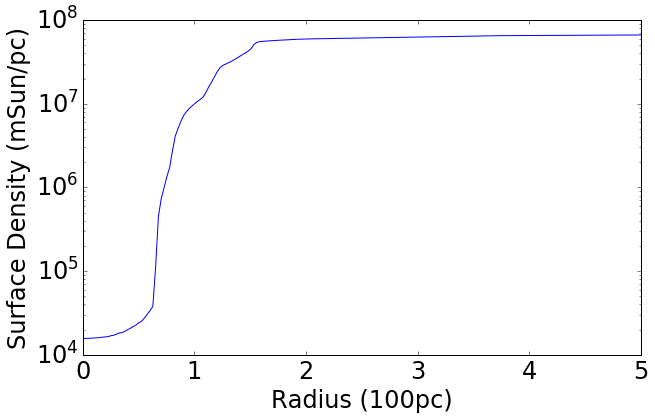

In [4]:
### The total summed mass for given radius
plt.close()
out_path = '/beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_refinement_test/OUTPUT/'
save_path = '/beegfs/work/workspace/ws/hd_rm238-zoomins-0/sim_refinement_test/anal/'
rsnap.io_flags['sgchem'] = True
rsnap.io_flags['mc_tracer']=False
data, header = rsnap.read_snapshot(out_path+'whole_disk_150')
t = header['time']
x,y,z=data['pos'].T
x,y,z = x-120.0, y-120.0, z-120.0
rho = data['rho']
mass = data['mass']

rmin = 0.
rmax = 5.
rstep = 0.025 # must be a factor of rmax-rmin
nstep = (rmax-rmin)/rstep
rbins = np.linspace(rmin,rmax,nstep)
mass_enc = np.zeros(len(rbins))
#print nstep

for nbin in range(len(rbins)):
    mass_enc[nbin] = sum(mass[(np.power(x,2) + np.power(y,2) < rbins[nbin] + rstep)])

    
#print mass_enc
plt.rcParams.update({'font.size': 24}) #set fontsize
histfig = plt.figure(3,figsize=(10,6))
histfig.clf()
ax = histfig.gca()
plt.ylabel('Surface Density (mSun/pc)')
plt.xlabel('Radius (100pc)')
plt.plot(rbins,mass_enc)
ax.set_yscale('log')
#ax.set_ylim(5e6,6e10)
#legend = plt.legend(loc='upper left', shadow=False, fontsize=18)#'x-large')
plt.show()
# Save figure
# Need to save it as a PDF, otherewise, lose transparency
#plt.savefig(save_path + 'rho_histogram_vol_'+file_suffix+'.pdf',format='pdf', dpi=100, bbox_inches='tight')



